<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Brandon Marshall
    Section 2
    11/29/18

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy.fftpack import fft, ifft
import imageio
from scipy.fftpack import fft2, ifft2
from scipy.signal import fftconvolve

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        #initialize rate and samples
        self.rate = rate
        self.samples = samples
        return
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        raise NotImplementedError("Problem 1.1 Incomplete")

    # Problems 1.1 and 1.7
    def plot(self,DFT = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #if just plotting time
        if DFT == False:
            #convert x axis to seconds
            sec = len(self.samples) / self.rate
            x = np.linspace(0,sec, len(self.samples))
            plt.plot(x,samples)
            plt.title("Sound")
            plt.xlabel("seconds")
            plt.ylabel("amplitude")
            plt.ylim(-32768,32767)
            plt.show()
            return
        #if plottting sound plots and DFT plots
        else:
            #convert x axis to seconds
            sec = len(self.samples)/ self.rate
            x = np.linspace(0,sec,len(self.samples))
            ax1 = plt.subplot(121)
            ax2 = plt.subplot(122)
            ax1.plot(x,self.samples)
            #for sound plot
            ax1.set_title("Sound")
            ax1.set_ylabel("amplitude")
            ax1.set_xlabel("seconds")
            ax1.set_ylim(-32768,32767)
            #compute DFT
            DFT = fft(self.samples)
            k = np.arange(0,len(DFT))
            #convert x axis to Hz
            x = (k / len(self.samples)) * self.rate
            #only plot half since the graph is symmetric
            ax2.plot(x[:len(x)//2],np.abs(DFT[:len(DFT)//2]))
            ax2.set_xlabel("Hz")
            ax2.set_ylabel("Magnitude")
            ax2.set_title("DFT")
            plt.show()
            return
        raise NotImplementedError("Problem 1.1 Incomplete")

    # Problem 1.2
    def export(self, filename, force=False):
        
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #only use reals for scaling and exporting
        self.samples_scaled = self.samples.real
        #if not right type or if Force is True
        if self.samples.dtype != 'int16' or force == True:
            self.samples_scaled = np.int16((self.samples.real * 32767.) / (max(abs(self.samples.real))))
        wavfile.write(filename,self.rate,self.samples_scaled)
        return
        raise NotImplementedError("Problem 1.2 Incomplete")
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #if not same shape
        if self.samples.shape != other.samples.shape:
            raise ValueError("Sample array are not the same length")
        #adds element wise
        newSample = self.samples + other.samples
        #rates should be the same
        rate = self.rate
        NewNote = SoundWave(rate,newSample)
        return NewNote
        raise NotImplementedError("Problem 1.4 Incomplete")

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #if rates aren't the same
        if self.rate != other.rate:
            raise ValueError("Sample rates are not the same")
        #hstack to create larger wave with all waves
        Sample = np.hstack((self.samples,other.samples))
        #rates should be the same
        rate = self.rate
        NoteShift = SoundWave(rate,Sample)
        return NoteShift
        raise NotImplementedError("Problem 1.4 Incomplete")
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("The rates of both Soundwaves must be the same")
        #find lengths of the two samples
        n = len(self.samples)
        m = len(other.samples)
        #make copies so we don't accidently alter originals
        first = self.samples.copy()
        second = other.samples.copy()
        #if self(first) is less than other(second)
        if n < m:
            pad = np.zeros(m-n)
            first = np.hstack((first,pad))
        #if other(second) is less than self(first)
        elif m < n:
            pad = np.zeros(n-m)
            second = np.hstack((second,pad))
        return SoundWave(self.rate, ifft(np.multiply(fft(first), fft(second))).real)
        raise NotImplementedError("Problem 2.1 Incomplete")

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #if rates are not the same
        if self.rate != other.rate:
            raise ValueError("The rates of both Soundwaves must be the same")
        #find lengths
        n = len(self.samples)
        m = len(other.samples)
        #make copies so we don't accidently overwrite the original data
        first = self.samples.copy()
        second = other.samples.copy()
        #find closest power of two
        k = 0
        pow2 = 2**k
        while(pow2 < n+m-1):
            k +=1
            pow2 = 2**k
        #adjust length of both arrays so that they're powers of 2
        if n < pow2:
            pad = np.zeros(pow2-n)
            first = np.hstack((first,pad))
        if m < pow2:
            pad = np.zeros(pow2-m)
            second = np.hstack((second,pad))
        return SoundWave(self.rate, ifft(np.multiply(fft(first),fft(second)))[:n+m-1].real)
        raise NotImplementedError("Problem 2.2 Incomplete")

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #get length
        n = len(self.samples)
        #compute low and high indices
        klow = round((low_freq*n)/self.rate)
        khigh = round((high_freq*n)/self.rate)
        #turn all indices in array between klow and khigh to 0
        DFT = fft(self.samples)
        DFT[klow:khigh+1] = 0
        #account for symmetry
        DFT[n-khigh:n-klow] = 0
        #replace original sample
        self.samples = ifft(DFT)
        return
        raise NotImplementedError("Problem 2.4 Incomplete")

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

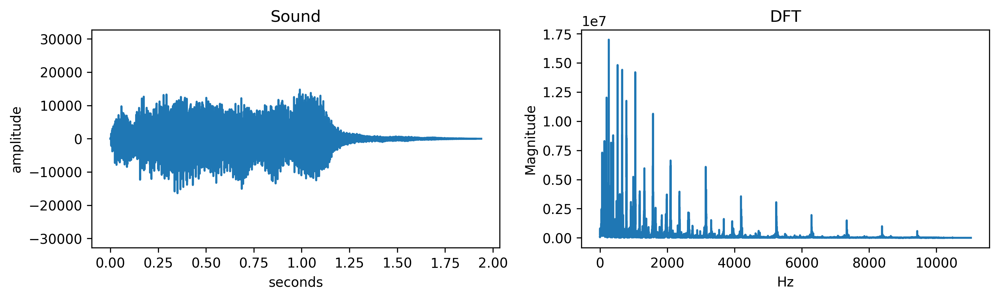

In [4]:
#load and plot file
Tadarate, samples = wavfile.read("tada.wav")
Tada = SoundWave(Tadarate,samples)
Tada.plot(True)

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
#play tada
IPython.display.Audio(filename = "tada.wav")

In [6]:
#write original tada to new file, then play it
Tada.export("tada_orig.wav")
IPython.display.Audio(filename = "tada_orig.wav")

In [7]:
#export scaled file, then play it (should be louder than original tada)
Tada.export("tada_scaled.wav", True)
IPython.display.Audio(filename = "tada_scaled.wav")

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #default rate
    rate = 44100
    #create rs samples in range of [0,s]
    x = np.linspace(0,duration,rate*duration)
    #sample sin(2pikx) rs times of interval [0,s]
    sound = np.sin((2*np.pi)*x*frequency)
    Notewave = SoundWave(rate,sound)
    return Notewave
    raise NotImplementedError("Problem 1.3 Incomplete")

In [9]:
note = generate_note(440,2)
IPython.display.Audio(data = note.samples, rate = 44100)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [10]:
#make A,C,E for Aminor that lasts 3 seconds
A = generate_note(440,3)
C = generate_note(523.25,3)
E = generate_note(659.25,3)
chord = A + C + E
IPython.display.Audio(data = chord.samples, rate = 44100)

In [11]:
#make apreggio that lasts 1 second
A1 = generate_note(440,1)
C = generate_note(523.25,1)
E = generate_note(659.25,1)
Arpeg = A1 >> C >> E
IPython.display.Audio(data = Arpeg.samples, rate = 44100)

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    n = samples.size
    #make coefficient array for k and l
    coeff = np.empty((n,n))
    for k in range(0,n):
        for l in range(0,n):
            coeff[k,l] = k*l
    #make DFT using coefficient array
    Wn = (1/n) * np.exp(2*np.pi*(0-1j)*coeff/n)
    return np.dot(Wn,samples)
    raise NotImplementedError("Problem 1.5 Incomplete")

In [13]:
#check that function works
x = np.array([1,1,0,0])
np.allclose(4 * simple_dft(x),fft(x))


True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        """split the given array to compute in fft
        Paramters:
            g ((n,) ndarray): the given array of samples from simple_fft
        Returns:
            ((n,) ndarray): The DFT of the given array
        """
        #n is numbers of entries in g
        n = g.size
        #if n is sufficiently small, use DFT
        if n <= threshold:
            return n * simple_dft(g)
        #if large, use FFT 
        else:
            #recursively split until down to size n that will compute DFT
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.zeros(n)
            #compute z using array broadcasting
            k = np.arange(0,n)
            z = np.exp((0-1j)*2*np.pi*k/n)
            m = n//2
            #build FFT by concatenating the two halves
            return np.concatenate(((even+np.multiply(z[:m],odd)),(even + np.multiply(z[m:],odd))))
    return split(samples) / samples.size
    raise NotImplementedError("Problem 1.6 Incomplete")

In [15]:
#check with array of size 8192 (2^13)
x = np.random.random((8192,))
print(np.allclose(fft(x), 8192*simple_fft(x)))
print(np.allclose(simple_fft(x),simple_fft(x)))
#time against scipy's fft
%time simple_dft(x)
%time simple_fft(x)
%time fft(x)

True
True
CPU times: user 15.2 s, sys: 173 ms, total: 15.4 s
Wall time: 14.9 s
CPU times: user 224 ms, sys: 451 ms, total: 675 ms
Wall time: 176 ms
CPU times: user 95 µs, sys: 9 µs, total: 104 µs
Wall time: 90.6 µs


array([  4.10353830e+03 +0.j        ,  -2.89539096e+01+12.20686913j,
         1.28409774e+01+11.09211051j, ...,   6.42591062e-02+14.45300793j,
         1.28409774e+01-11.09211051j,  -2.89539096e+01-12.20686913j])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

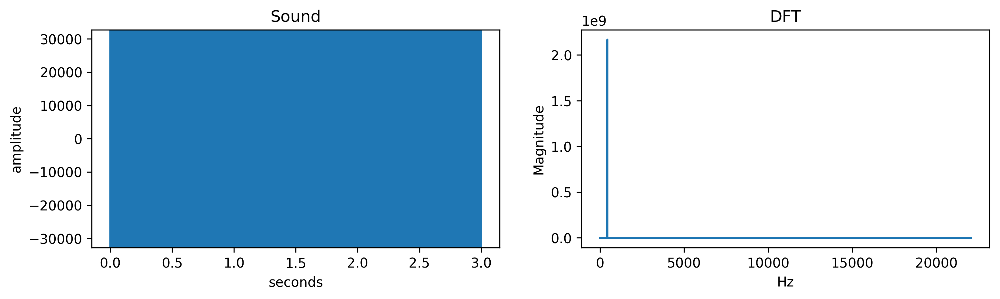

In [16]:
#plot DFT of A
A.export("Anote.wav")
rate, samples = wavfile.read("Anote.wav")
A = SoundWave(rate,samples)
A.plot(DFT = True)

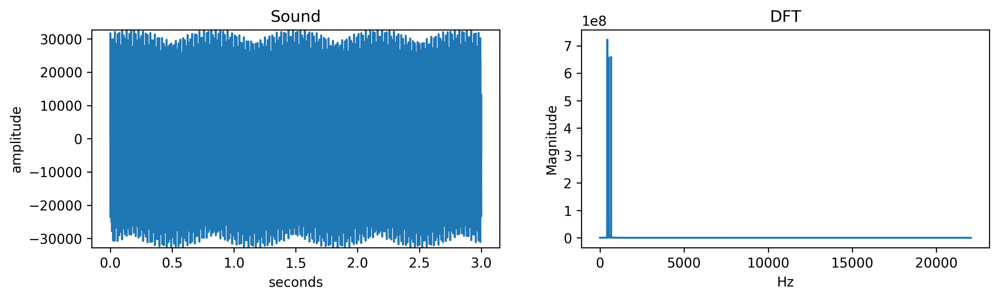

In [17]:
#plot DFT of Aminor
chord.export("chord.wav")
rate, samples = wavfile.read("chord.wav")
chord = SoundWave(rate,samples)
chord.plot(DFT = True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

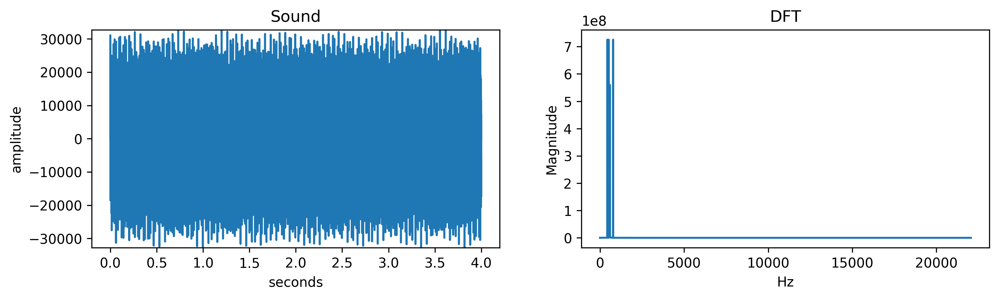

[ 440.    784.    523.25  587.5   587.25]


In [18]:
#create mystery soundwave
rates,samples = wavfile.read("mystery_chord.wav")
mystery = SoundWave(rates,samples)
#plot to see how many notes there are
mystery.plot(DFT = True)
DFT = fft(mystery.samples)
#take largest 5 magnitudes indices
idx = np.argsort(np.abs(DFT[:len(samples)//2]))[::-1][:5]
#convert to Hz
idx = (idx / len(samples))*rates
print(idx)

In [19]:
print("The notes in the mystery chord are A,G,C,and D")

The notes in the mystery chord are A,G,C,and D


The notes are...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [20]:
#make white noise
rate = Tadarate
white_noise = np.random.randint(-32767, 32767, rate*2, dtype = np.int16)
white_noise = SoundWave(rate,white_noise)
#convolve Tada with white noise
conv = Tada * white_noise
IPython.display.Audio(data = conv.samples,rate = 44100)

In [21]:
#convolve with itself
conv = conv >> conv
IPython.display.Audio(data = conv.samples, rate = 44100)

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [22]:
#make CGC and GCG
rateCGC, samplesCGC = wavfile.read("CGC.wav")
rateGCG, samplesGCG = wavfile.read("GCG.wav")
CGC = SoundWave(rateCGC,samplesCGC)
GCG = SoundWave(rateGCG,samplesGCG)
#time linear convolve we wrote against scipys
%time CGC**GCG
%time fftconvolve(CGC.samples,GCG.samples)

CPU times: user 76.8 ms, sys: 1.96 ms, total: 78.7 ms
Wall time: 78.3 ms
CPU times: user 18.8 ms, sys: 0 ns, total: 18.8 ms
Wall time: 18.4 ms


array([  2.37037037e-03,  -4.74074074e-04,   8.91088000e+06, ...,
        -5.55668563e+08,  -2.53623938e+08,  -6.74017190e+07])

In [23]:
#compare for listening
#original CGC
IPython.display.Audio(data = CGC.samples, rate = CGC.rate)

In [24]:
#original GCG
IPython.display.Audio(data = GCG.samples,rate = GCG.rate)

In [25]:
#my linear convolve
conv1 = CGC**GCG
IPython.display.Audio(data = conv1.samples,rate = conv1.rate)

In [26]:
#scipy's linear convolve
conv2 = fftconvolve(CGC.samples,GCG.samples)
IPython.display.Audio(data = conv2, rate = conv1.rate)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [27]:
#build and hear Chopin file
rateChop, sampChop = wavfile.read("chopin.wav")
Chop = SoundWave(rateChop,sampChop)
IPython.display.Audio(data = Chop.samples,rate = Chop.rate)

In [28]:
#build and hear balloon file
rateBal, sampBal = wavfile.read("balloon.wav")
Bal = SoundWave(rateBal,sampBal)
IPython.display.Audio(data = Bal.samples, rate = Bal.rate)


In [29]:
#convolve Chopin with balloon and hear
conv3 = Chop**Bal
IPython.display.Audio(data = conv3.samples, rate = conv3.rate)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [30]:
#build and hear noisy1
RateN1, SampN1 = wavfile.read("noisy1.wav")
noisy1 = SoundWave(RateN1,SampN1)
IPython.display.Audio(data = noisy1.samples, rate = noisy1.rate)

In [31]:
#clean noisy1 and hear
noisy1.clean(1250, 2600)
IPython.display.Audio(data = noisy1.samples, rate = noisy1.rate)

/usr/local/anaconda3/lib/python3.6/site-packages/IPython/lib/display.py:124: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


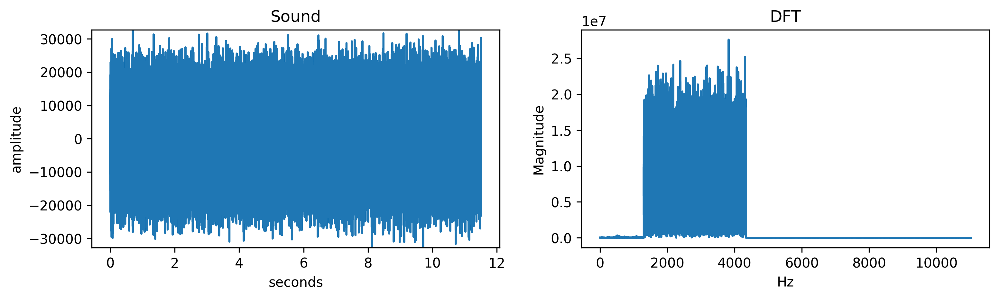

In [32]:
#build and hear noisy2
rateN2, SampN2 = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rateN2, SampN2)
noisy2.plot(True)
IPython.display.Audio(data = noisy2.samples, rate = noisy2.rate)


In [33]:
#clean and hear noisy2
noisy2.clean(13000, 43000)
IPython.display.Audio(data = noisy2.samples, rate = noisy2.rate)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [34]:
#build and hear vuvuzela
Vrate,Vsample = wavfile.read("vuvuzela.wav")
#need to transpose since IPython.display.Audio takes mxn matrix instead of nxm
IPython.display.Audio(data = Vsample.T, rate = Vrate)

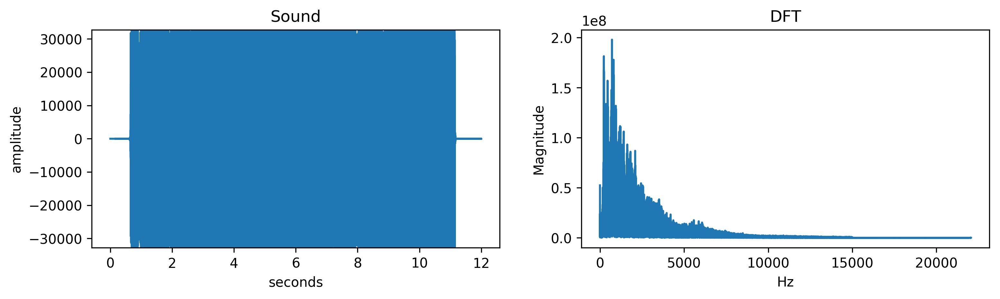

In [35]:
#build left and right wave out of stereo sound
VsampleL = Vsample[:,0]
VsampleR = Vsample[:,1]
LV = SoundWave(Vrate,VsampleL)
RV = SoundWave(Vrate,VsampleR)
#plot DFT to find noise
LV.plot(True)


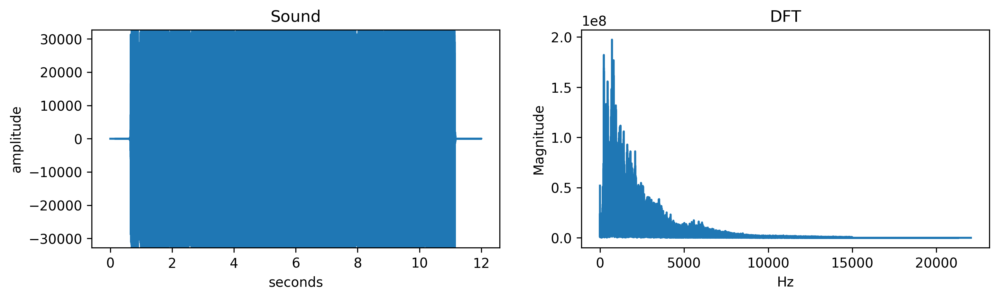

In [36]:
#plot DFT to find noise
RV.plot(True)

In [37]:
#clean where vuvuzela noise is
LV.clean(100,600)
RV.clean(100,600)
#put back into stereo sound and hear
Vsample = np.hstack((np.vstack(LV.samples),np.vstack(RV.samples)))
IPython.display.Audio(data = Vsample.T, rate = Vrate)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

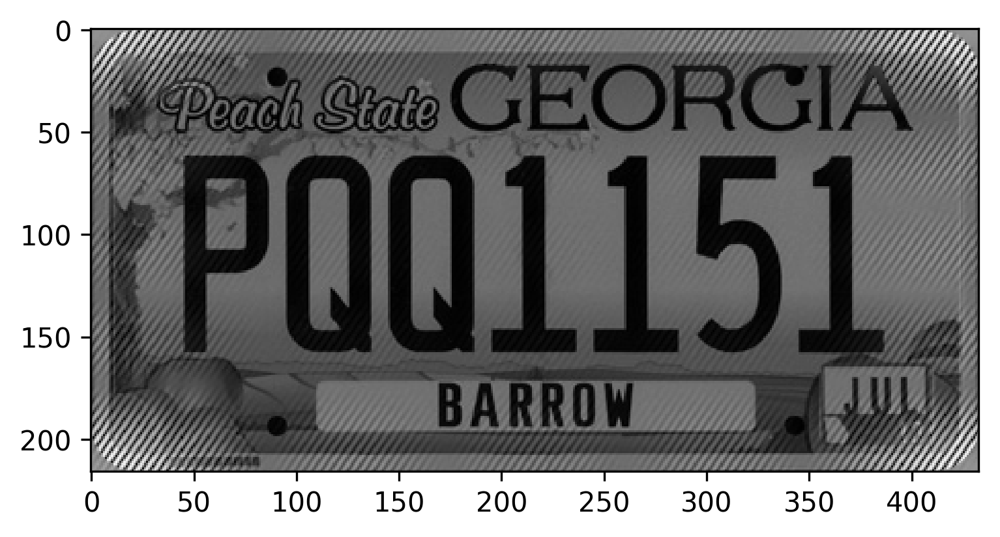

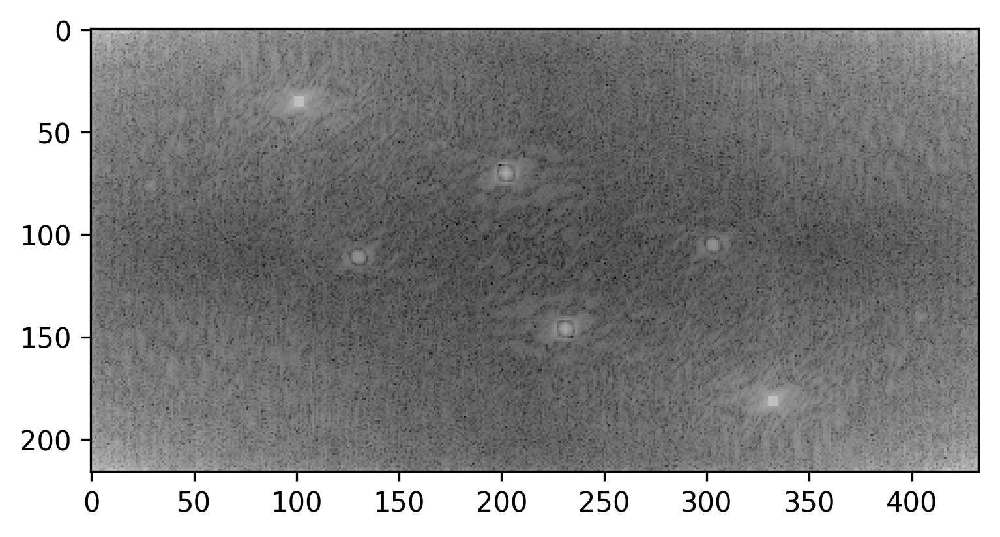

In [38]:
#get license plat matrix and show
image = imageio.imread("license_plate.png")
plt.imshow(image, cmap = "gray")
plt.show()
#take 2D dft of image and show
image_dft = fft2(image)
plt.imshow(np.log(np.abs(image_dft)),cmap = "gray")
plt.show()

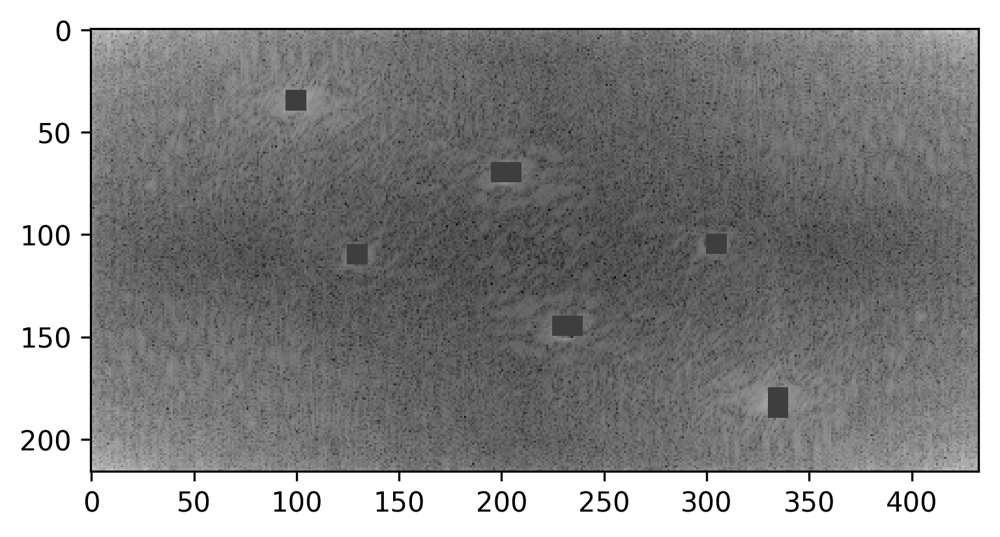

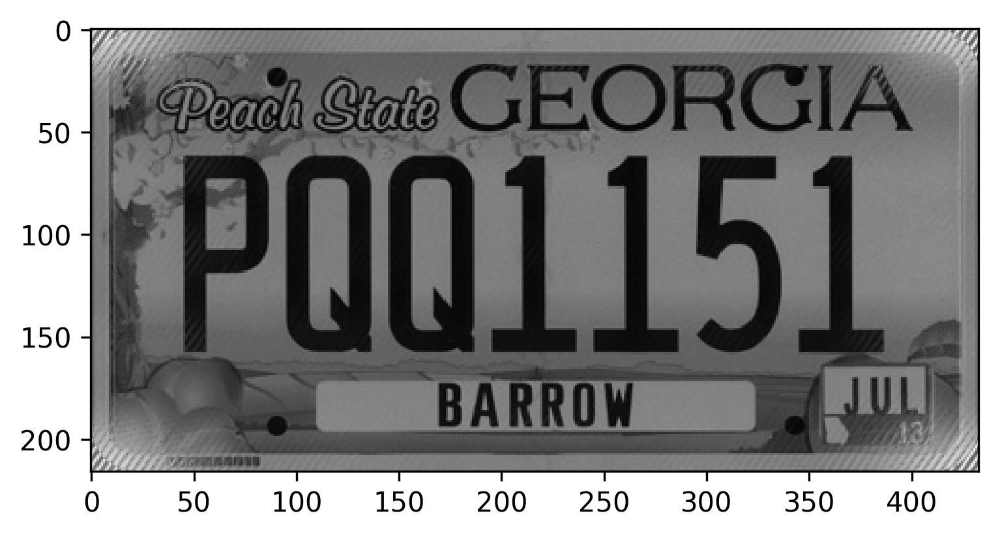

In [39]:
#find mean of whole matrix
mean = np.mean(image_dft)
#replace "bright spots" on DFT map with mean
image_dft[175:190,330:340] = mean
image_dft[-175:-190,-330:-340] = mean
image_dft[100:110,300:310] = mean
image_dft[140:150,225:240] = mean
image_dft[65:75,195:210] = mean
image_dft[105:115,125:135] = mean
image_dft[30:40,95:105] = mean
#show to see if replaced right spots
plt.imshow(np.log(np.abs(image_dft)),cmap = "gray")
plt.show()
#put "cleaned" image back together
image = ifft2(image_dft).real
plt.imshow(image,cmap="gray")
plt.show()

The year on the sticker is...

In [40]:
print("The year on the sticker is '13'")

The year on the sticker is '13'
